# Import libs

In [1]:
import sys
import os
import itertools
sys.path.append('..')
from eflow.foundation import DataPipeline,DataFrameTypes
from eflow.model_analysis import ClassificationAnalysis
from eflow.utils.modeling_utils import optimize_model_grid
from eflow.utils.eflow_utils import get_type_holder_from_pipeline, remove_unconnected_pipeline_segments
from eflow.utils.sys_utils import load_pickle_object
from eflow.utils.pandas_utils import data_types_table
from eflow.auto_modeler import AutoCluster
from eflow.data_pipeline_segments import DataEncoder

import pandas as pd
import numpy as np
from dtreeviz.trees import *
from functools import partial
import scikitplot as skplt
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import copy
import pickle
import time
import math
import multiprocessing as mp
from functools import partial
from scipy import stats
from IPython.display import clear_output

In [2]:
%matplotlib notebook
%matplotlib inline

## Declare Project Variables

### Interaction required

In [3]:
dataset_path = "Datasets/titanic_train.csv"

# -----
dataset_name = "Titanic Data"
pipeline_name = "Titanic Pipeline"

# -----


# -----
notebook_mode = True

## Clean out segment space

In [4]:
remove_unconnected_pipeline_segments()

# Import dataset

In [5]:
df = pd.read_csv(dataset_path)
shape_df = pd.DataFrame.from_dict({'Rows': [df.shape[0]],
                                   'Columns': [df.shape[1]]})
display(shape_df)
display(df.head(30))

,Rows,Columns
0,891,12


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
5,6,0,3,"Moran, Mr. James",male,NaN,0,0,330877,8.4583,NaN,Q
6,7,0,1,"McCarthy, Mr. Timothy J",male,54.0,0,0,17463,51.8625,E46,S
7,8,0,3,"Palsson, Master. Gosta Leonard",male,2.0,3,1,349909,21.0750,NaN,S
8,9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27.0,0,2,347742,11.1333,NaN,S
9,10,1,2,"Nasser, Mrs. Nicholas (Adele Achem)",female,14.0,1,0,237736,30.0708,NaN,C


In [6]:
data_types_table(df)

,Data Types
Features,
Age,float64
Fare,float64
PassengerId,int64
Survived,int64
Pclass,int64
SibSp,int64
Parch,int64
Name,object
Sex,object


# Loading and init df_features

In [7]:
# Option: 1
# df_features = get_type_holder_from_pipeline(pipeline_name)

In [8]:
# Option: 2
df_features = DataFrameTypes()
df_features.init_on_json_file(os.getcwd() + f"/eflow Data/{dataset_name}/df_features.json")

In [9]:
df_features.display_features(display_dataframes=True,
                             notebook_mode=notebook_mode)

,Data Types
Features,
Sex,string
Cabin,string
Embarked,string
Survived,bool
SibSp,integer
Parch,integer
Age,float
Fare,float
Pclass,category


# Any extra processing before eflow DataPipeline

# Setup pipeline structure

### Interaction Required

In [10]:
main_pipe = DataPipeline(pipeline_name,
                         df,
                         df_features)

The file 'root_pipeline.json' exist!
Now configuring object with proper pipeline segments...
Removing the feature: "PassengerId"
Removing the feature: "Ticket"
Removing the feature: "Name"


In [11]:
main_pipe.perform_pipeline(df,
                           df_features)

Ignore feature:  Parch


In [12]:
df.drop(columns=[df_features.target_feature()],
        inplace=True)
df_features.remove_feature(df_features.target_feature())

# Declare Variables

In [13]:
qualitative_features=list(df_features.get_dummy_encoded_features().keys())

In [14]:
require_binning = df_features.continuous_numerical_features()
require_binning

{'Age', 'Fare', 'Parch', 'SibSp'}

In [15]:
require_binning -= {'Parch', 'SibSp'}
require_binning

{'Age', 'Fare'}

In [16]:
df

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Pclass_1,Pclass_2,Pclass_3,Embarked_Cherbourg,Embarked_Queenstown,Embarked_Southampton
0,22.0,1,0,7.2500,False,True,False,False,True,False,False,True
1,38.0,1,0,71.2833,True,False,True,False,False,True,False,False
2,26.0,0,0,7.9250,True,False,False,False,True,False,False,True
3,35.0,1,0,53.1000,True,False,True,False,False,False,False,True
4,35.0,0,0,8.0500,False,True,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...
886,27.0,0,0,13.0000,False,True,False,True,False,False,False,True
887,19.0,0,0,30.0000,True,False,True,False,False,False,False,True
888,28.0,1,2,23.4500,True,False,False,False,True,False,False,True
889,26.0,0,0,30.0000,False,True,True,False,False,True,False,False


In [17]:
data_encoder = DataEncoder(create_file=False)

In [18]:
data_encoder.revert_dummies(df,
                            df_features,
                            qualitative_features=qualitative_features)

In [19]:
df

,Age,SibSp,Parch,Fare,Sex,Pclass,Embarked
0,22.0,1,0,7.2500,male,3,Southampton
1,38.0,1,0,71.2833,female,1,Cherbourg
2,26.0,0,0,7.9250,female,3,Southampton
3,35.0,1,0,53.1000,female,1,Southampton
4,35.0,0,0,8.0500,male,3,Southampton
...,...,...,...,...,...,...,...
886,27.0,0,0,13.0000,male,2,Southampton
887,19.0,0,0,30.0000,female,1,Southampton
888,28.0,1,2,23.4500,female,3,Southampton
889,26.0,0,0,30.0000,male,1,Cherbourg


In [20]:
data_encoder.apply_binning(df,
                           df_features,
                           require_binning)

In [21]:
df

,Age,SibSp,Parch,Fare,Sex,Pclass,Embarked
0,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,male,3,Southampton
1,32.252+ ⟷ 48.168,1,0,-0.512+ ⟷ 102.466,female,1,Cherbourg
2,16.336+ ⟷ 32.252,0,0,-0.512+ ⟷ 102.466,female,3,Southampton
3,32.252+ ⟷ 48.168,1,0,-0.512+ ⟷ 102.466,female,1,Southampton
4,32.252+ ⟷ 48.168,0,0,-0.512+ ⟷ 102.466,male,3,Southampton
...,...,...,...,...,...,...,...
886,16.336+ ⟷ 32.252,0,0,-0.512+ ⟷ 102.466,male,2,Southampton
887,16.336+ ⟷ 32.252,0,0,-0.512+ ⟷ 102.466,female,1,Southampton
888,16.336+ ⟷ 32.252,1,2,-0.512+ ⟷ 102.466,female,3,Southampton
889,16.336+ ⟷ 32.252,0,0,-0.512+ ⟷ 102.466,male,1,Cherbourg


In [22]:
value_matrix = []

for feature_name in df.columns:
    value_matrix.append(df[feature_name].dropna().unique().tolist())

feature_columns = copy.deepcopy(df.columns)
del df

In [23]:
df = pd.DataFrame(list(itertools.product(*value_matrix)), columns=feature_columns)

In [24]:
df

,Age,SibSp,Parch,Fare,Sex,Pclass,Embarked
0,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,male,3,Southampton
1,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,male,3,Cherbourg
2,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,male,3,Queenstown
3,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,male,1,Southampton
4,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,male,1,Cherbourg
...,...,...,...,...,...,...,...
13225,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,female,1,Cherbourg
13226,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,female,1,Queenstown
13227,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,female,2,Southampton
13228,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,female,2,Cherbourg


In [25]:
data_encoder.make_dummies(df,
                            df_features,
                            qualitative_features=qualitative_features)

In [26]:
df

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Pclass_1,Pclass_2,Pclass_3,Embarked_Cherbourg,Embarked_Queenstown,Embarked_Southampton
0,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,False,True,False,False,True,False,False,True
1,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,False,True,False,False,True,True,False,False
2,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,False,True,False,False,True,False,True,False
3,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,False,True,True,False,False,False,False,True
4,16.336+ ⟷ 32.252,1,0,-0.512+ ⟷ 102.466,False,True,True,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
13225,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,True,False,True,False,False,True,False,False
13226,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,True,False,True,False,False,False,True,False
13227,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,True,False,False,True,False,False,False,True
13228,64.084+ ⟷ 80.0,8,6,102.466+ ⟷ 204.932,True,False,False,True,False,True,False,False


In [27]:
for feature_name, bins_labels in df_features.get_all_feature_binning().items():
    bins = bins_labels["bins"]
    labels = bins_labels["labels"]
    label_bin_avg = dict()
    for i,l in enumerate(labels):
        label_bin_avg[l] = sum(bins[i:i+2])/2
         
    df.replace(label_bin_avg,inplace=True)

In [28]:
df

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Pclass_1,Pclass_2,Pclass_3,Embarked_Cherbourg,Embarked_Queenstown,Embarked_Southampton
0,24.294,1,0,50.977,False,True,False,False,True,False,False,True
1,24.294,1,0,50.977,False,True,False,False,True,True,False,False
2,24.294,1,0,50.977,False,True,False,False,True,False,True,False
3,24.294,1,0,50.977,False,True,True,False,False,False,False,True
4,24.294,1,0,50.977,False,True,True,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
13225,72.042,8,6,153.699,True,False,True,False,False,True,False,False
13226,72.042,8,6,153.699,True,False,True,False,False,False,True,False
13227,72.042,8,6,153.699,True,False,False,True,False,False,False,True
13228,72.042,8,6,153.699,True,False,False,True,False,True,False,False


# Load Model

In [29]:
model = load_pickle_object(os.getcwd() + "/eflow Data/Titanic Data/Classification Analysis/Target Feature: Survived/RandomForestClassifier/RandomForestClassifier.pkl")
model_predictions = model.predict(df)
predicted_classes = set(sorted(model_predictions.tolist()))
cluster_results = [None for i in range(0,len(model_predictions))]

target=0

Inspecting scaled results!


,Mean,Standard Dev
Age,1.131072e-16,1.0
SibSp,1.413840e-17,1.0
Parch,8.836497e-18,1.0
Fare,-2.730478e-16,1.0
Sex_female,5.832088e-17,1.0
Sex_male,-5.832088e-17,1.0
Pclass_1,-6.362278e-17,1.0
Pclass_2,6.362278e-17,1.0
Pclass_3,-8.129577e-17,1.0
Embarked_Cherbourg,-7.422658e-17,1.0


12


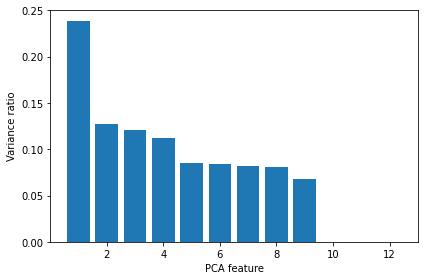

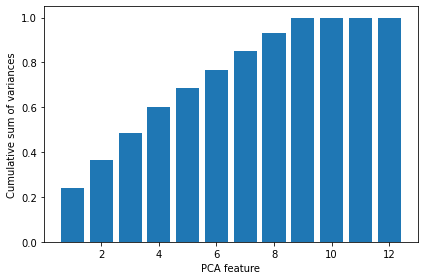

12

Inspecting applied scaler and pca results!


,Mean,Standard Dev
PCA_Feature_1,-7.069198e-18,1.691700e+00
PCA_Feature_2,-4.506614e-17,1.237858e+00
PCA_Feature_3,-3.181139e-17,1.205432e+00
PCA_Feature_4,1.678934e-17,1.159542e+00
PCA_Feature_5,-9.189957e-17,1.011184e+00
PCA_Feature_6,8.483037e-17,1.002796e+00
PCA_Feature_7,-1.413840e-17,9.937820e-01
PCA_Feature_8,2.827679e-17,9.875211e-01
PCA_Feature_9,1.413840e-17,9.040812e-01
PCA_Feature_10,-3.685793e-17,4.136456e-16


After applying pca with a cutoff percentage 0.8% for the cumulative index. Using features 1 to 7
Old shape (8041, 12)
New shape (8041, 7)

Inspecting data after final scaler applied!


,Mean,Standard Dev
PCA_Feature_1,3.534599e-18,1.0
PCA_Feature_2,-3.004409e-17,1.0
PCA_Feature_3,-1.590569e-17,1.0
PCA_Feature_4,7.069198e-18,1.0
PCA_Feature_5,-2.827679e-17,1.0
PCA_Feature_6,-7.069198e-18,1.0
PCA_Feature_7,0.000000e+00,1.0


K-Means Elbow Seq Count 1:   0%|          | 0/11 [00:00<?, ?it/s, model_count=1]

Found past models in directory structure! Attempting to re-initalize models...
K-Means_Clusters=6 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/Exansion Auto Clustering/Clustering/Target=0/Models/K-Means/Clusters=6/K-Means_Clusters=6.pkl

K-Means_Clusters=4 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/Exansion Auto Clustering/Clustering/Target=0/Models/K-Means/Clusters=4/K-Means_Clusters=4.pkl

K-Means_Clusters=3 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/Exansion Auto Clustering/Clustering/Target=0/Models/K-Means/Clusters=3/K-Means_Clusters=3.pkl

K-Means_Clusters=5 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/

K-Means Elbow Seq Count 10: 100%|██████████| 11/11 [00:05<00:00,  2.09it/s, model_count=11]


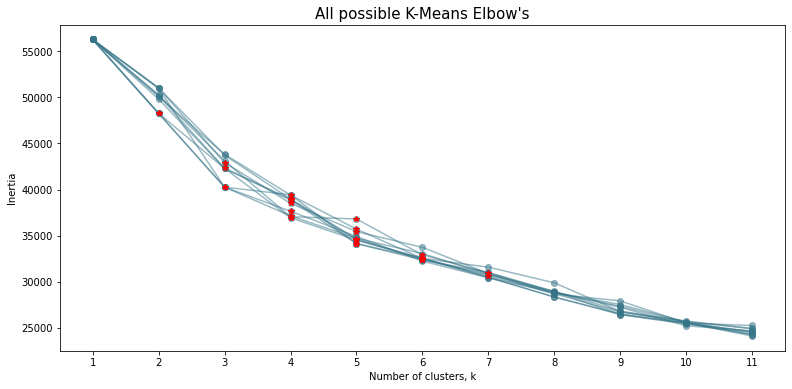

[56287.00000000001, 48266.58002526452, 42303.39480384681, 36943.59111083447, 34519.76481616011, 32504.200709901263, 30459.913101517872, 28352.64193382865, 26443.062288124216, 25508.276697494413, 24608.727012892443]


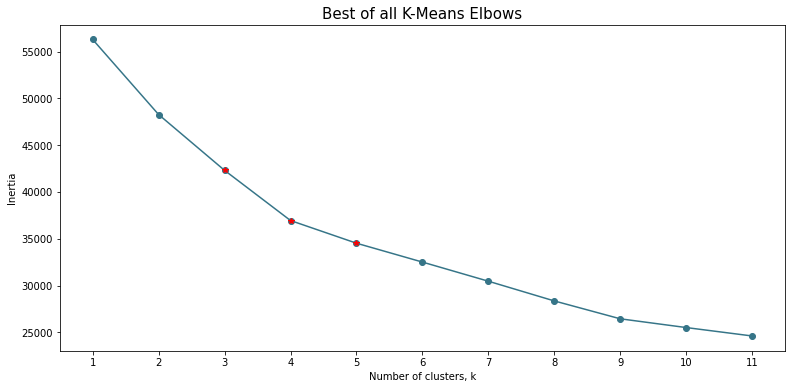

,Proximity Elbow,Counts
0,4,8
1,5,8
2,6,6
4,3,4
3,2,2
5,7,2


,Main Elbows,Counts
0,5,4
1,3,2
2,4,2
3,6,2


target=1

Inspecting scaled results!


,Mean,Standard Dev
Age,6.572760e-17,1.0
SibSp,-1.643190e-17,1.0
Parch,-6.709692e-17,1.0
Fare,-2.861889e-16,1.0
Sex_female,-1.752736e-16,1.0
Sex_male,0.000000e+00,1.0
Pclass_1,9.568158e-17,1.0
Pclass_2,2.190920e-17,1.0
Pclass_3,-1.095460e-17,1.0
Embarked_Cherbourg,-9.859140e-17,1.0


12


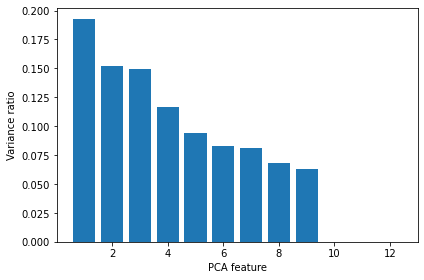

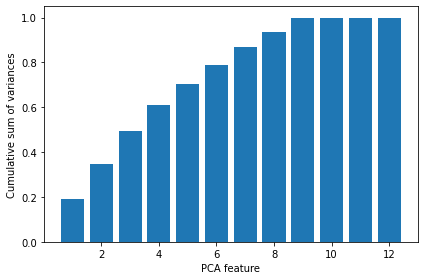

12

Inspecting applied scaler and pca results!


,Mean,Standard Dev
PCA_Feature_1,2.190920e-17,1.520931e+00
PCA_Feature_2,1.369325e-18,1.351350e+00
PCA_Feature_3,-3.560245e-17,1.339117e+00
PCA_Feature_4,4.381840e-17,1.181429e+00
PCA_Feature_5,3.286380e-17,1.063885e+00
PCA_Feature_6,-2.738650e-17,9.962284e-01
PCA_Feature_7,-4.381840e-17,9.841527e-01
PCA_Feature_8,-8.763680e-17,9.049830e-01
PCA_Feature_9,-4.381840e-17,8.716296e-01
PCA_Feature_10,4.942367e-17,6.370226e-16


After applying pca with a cutoff percentage 0.8% for the cumulative index. Using features 1 to 7
Old shape (5189, 12)
New shape (5189, 7)

Inspecting data after final scaler applied!


,Mean,Standard Dev
PCA_Feature_1,2.190920e-17,1.0
PCA_Feature_2,0.000000e+00,1.0
PCA_Feature_3,-1.232392e-17,1.0
PCA_Feature_4,2.738650e-17,1.0
PCA_Feature_5,2.190920e-17,1.0
PCA_Feature_6,-2.190920e-17,1.0
PCA_Feature_7,-4.381840e-17,1.0


K-Means Elbow Seq Count 1:   9%|▉         | 1/11 [00:00<00:01,  7.15it/s, model_count=2]

Found past models in directory structure! Attempting to re-initalize models...
K-Means_Clusters=6 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/Exansion Auto Clustering/Clustering/Target=1/Models/K-Means/Clusters=6/K-Means_Clusters=6.pkl

K-Means_Clusters=7 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/Exansion Auto Clustering/Clustering/Target=1/Models/K-Means/Clusters=7/K-Means_Clusters=7.pkl

K-Means_Clusters=4 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/Exansion Auto Clustering/Clustering/Target=1/Models/K-Means/Clusters=4/K-Means_Clusters=4.pkl

K-Means_Clusters=5 was found at /Users/ericcacciavillani/Desktop/Coding/Python_Files/Artificial_Intelligence/Data Mining/eFlow/testing/eflow Data/Titanic Data/

K-Means Elbow Seq Count 10: 100%|██████████| 11/11 [00:03<00:00,  3.42it/s, model_count=11]


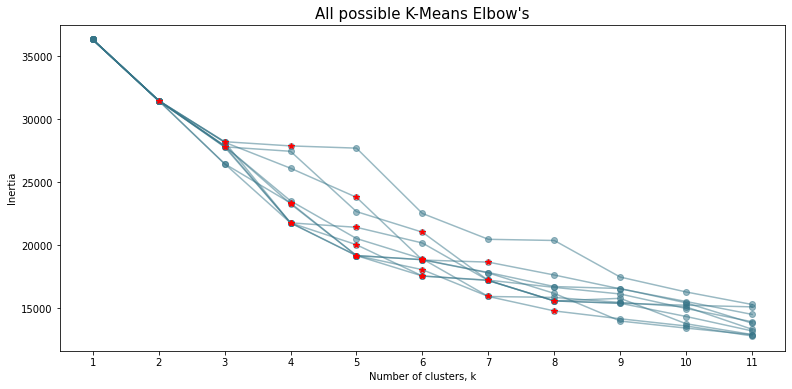

[36322.99999999987, 31472.401454663595, 27882.944848546507, 23276.328398640642, 19169.83755417876, 18842.156358497246, 17791.021070765368, 16167.678066389062, 13973.051685390634, 13412.873306244912, 12887.512055253166]


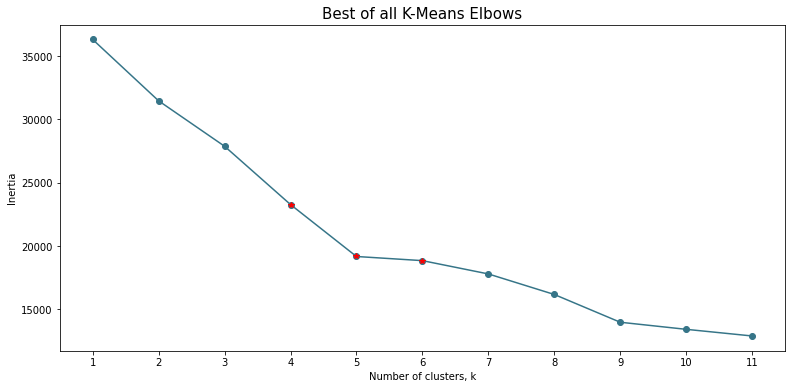

,Proximity Elbow,Counts
2,6,8
1,5,7
0,4,6
4,7,4
3,3,2
6,8,2
5,2,1


,Main Elbows,Counts
0,5,4
2,6,2
4,7,2
1,4,1
3,3,1


In [30]:
cluster_label_buffer = 0
cluster_cut_off_points = []
for target in predicted_classes:
    print(f"target={target}")
    bool_array = model_predictions == target
    auto_cluster = AutoCluster(df[bool_array],
                               dataset_name=dataset_name,
                               dataset_sub_dir=f"Exansion Auto Clustering/Clustering/Target={target}",
                               overwrite_full_path=None,
                               notebook_mode=True,
                               pca_perc=.8)

    best_clusters = auto_cluster.create_elbow_models(model_names=["K-Means"],
                                                     sequences=10,
                                                     max_k_value=11,
                                                     display_visuals=True)
    
    cluster_model = load_pickle_object(auto_cluster.folder_path + f"Models/K-Means/Clusters={best_clusters[1]}/K-Means_Clusters={best_clusters[1]}.pkl")
    tmp_results = cluster_model.predict(auto_cluster.apply_clustering_data_pipeline(df[bool_array]))
    
    
    cluster_count = 0
    for i,replace_val in enumerate(bool_array):
        if replace_val:
            cluster_results[i] = tmp_results[cluster_count] + cluster_label_buffer
            cluster_count += 1
            
    cluster_label_buffer += best_clusters[1]
    if len(cluster_cut_off_points):
        cluster_cut_off_points.append(cluster_cut_off_points[-1] + best_clusters[1])
    else:
        cluster_cut_off_points.append(best_clusters[1])
        

In [31]:
df["Target"] = cluster_results

/Users/ericcacciavillani/anaconda3/envs/eflow/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [32]:
df

,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Pclass_1,Pclass_2,Pclass_3,Embarked_Cherbourg,Embarked_Queenstown,Embarked_Southampton,Target
0,24.294,1,0,50.977,False,True,False,False,True,False,False,True,3
1,24.294,1,0,50.977,False,True,False,False,True,True,False,False,0
2,24.294,1,0,50.977,False,True,False,False,True,False,True,False,1
3,24.294,1,0,50.977,False,True,True,False,False,False,False,True,3
4,24.294,1,0,50.977,False,True,True,False,False,True,False,False,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13225,72.042,8,6,153.699,True,False,True,False,False,True,False,False,8
13226,72.042,8,6,153.699,True,False,True,False,False,False,True,False,7
13227,72.042,8,6,153.699,True,False,False,True,False,False,False,True,4
13228,72.042,8,6,153.699,True,False,False,True,False,True,False,False,8


# Seperate out data into train and test sets

In [33]:
feature_order = list(df.columns)
feature_order.remove("Target")

/Users/ericcacciavillani/anaconda3/envs/eflow/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [34]:
feature_order

['Age',
 'SibSp',
 'Parch',
 'Fare',
 'Sex_female',
 'Sex_male',
 'Pclass_1',
 'Pclass_2',
 'Pclass_3',
 'Embarked_Cherbourg',
 'Embarked_Queenstown',
 'Embarked_Southampton']

In [35]:
X = df.drop(columns="Target").values
y = df["Target"].values
del df


Inspecting scaled results!


,Mean,Standard Dev
Age,2.921657e-16,1.0
SibSp,6.874488e-17,1.0
Parch,0.000000e+00,1.0
Fare,1.235259e-16,1.0
Sex_female,0.000000e+00,1.0
Sex_male,0.000000e+00,1.0
Pclass_1,7.723728e-17,1.0
Pclass_2,7.725407e-17,1.0
Pclass_3,7.730442e-17,1.0
Embarked_Cherbourg,7.401487e-17,1.0


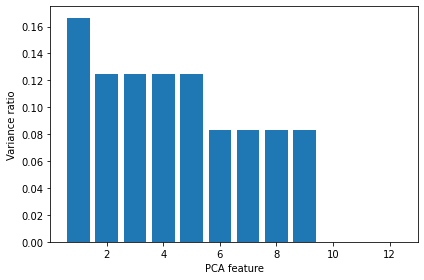

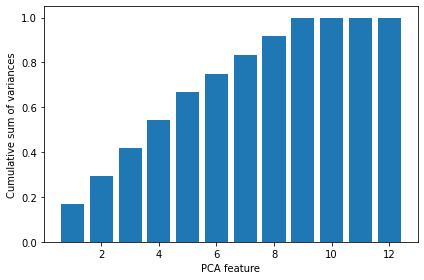


Inspecting applied scaler and pca results!


,Mean,Standard Dev
PCA_Feature_1,-5.907763e-18,1.414214e+00
PCA_Feature_2,-2.685347e-17,1.224745e+00
PCA_Feature_3,-1.604495e-17,1.224745e+00
PCA_Feature_4,4.247883e-17,1.224745e+00
PCA_Feature_5,-2.618213e-18,1.224745e+00
PCA_Feature_6,4.551663e-17,1.000000e+00
PCA_Feature_7,-2.577933e-17,1.000000e+00
PCA_Feature_8,5.155866e-17,1.000000e+00
PCA_Feature_9,5.907763e-17,1.000000e+00
PCA_Feature_10,4.506797e-17,5.409291e-16


After applying pca with a cutoff percentage 0.95% for the cumulative index. Using features 1 to 9
Old shape (13230, 12)
New shape (13230, 9)

Inspecting data after final scaler applied!


,Mean,Standard Dev
PCA_Feature_1,-5.303560e-18,1.0
PCA_Feature_2,-2.081144e-17,1.0
PCA_Feature_3,-1.476941e-17,1.0
PCA_Feature_4,1.173161e-17,1.0
PCA_Feature_5,-2.467162e-18,1.0
PCA_Feature_6,3.101575e-17,1.0
PCA_Feature_7,-1.718622e-17,1.0
PCA_Feature_8,-8.593109e-17,1.0
PCA_Feature_9,9.667248e-18,1.0


In [36]:
from eflow.decision_bounds.visualize_multidimensional import VisualizeMultidimensional


vis = VisualizeMultidimensional(X,
                                feature_names=feature_order,
                                dataset_name=dataset_name,
                                dataset_sub_dir="3D Vis",
                                overwrite_full_path=None,
                                notebook_mode=True,
                                pca_perc=.95)

In [37]:
vis.sort_data_points_by_distances()

/Users/ericcacciavillani/anaconda3/envs/eflow/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[74, 1586, 830, 1208, 1964, 1910, 1154, 776, 1532, 20, 398, 452, 506, 128, 1640, 884, 1262, 2018, 2126, 1370, 992, 1748, 236, 614, 668, 290, 1802, 1046, 1424, 2180, 2072, 1316, 938, 1694, 182, 560, 722, 344, 1856, 1100, 1478, 2234, 4880, 4124, 3746, 4502, 2990, 3368, 3206, 2828, 4340, 3584, 3962, 4718, 4826, 4070, 3692, 4448, 2936, 3314, 3260, 2882, 4394, 3638, 4016, 4772, 4664, 3908, 3530, 4286, 2774, 3152, 3098, 2720, 4232, 3476, 3854, 4610, 4556, 3800, 3422, 4178, 2666, 3044, 5690, 5312, 6824, 6068, 6446, 7202, 7256, 6500, 6122, 6878, 5366, 5744, 5798, 5420, 6932, 6176, 6554, 7310, 7418, 6662, 6284, 7040, 5528, 5906, 5960, 5582, 7094, 6338, 6716, 7472, 7364, 6608, 6230, 6986, 5474, 5852, 6014, 5636, 7148, 6392, 6770, 7526, 12818, 12062, 11684, 12440, 10928, 11306, 11144, 10766, 12278, 11522, 11900, 12656, 12764, 12008, 11630, 12386, 10874, 11252, 11198, 10820, 12332, 11576, 11954, 12710, 12602, 11846, 11468, 12224, 10712, 11090, 11036, 10658, 12170, 11414, 11792, 12548, 12494, 11738

In [38]:
scaled = vis.get_scaled_data()

In [39]:
indexes = vis.get_ordered_dp_indexes()

In [40]:
del vis

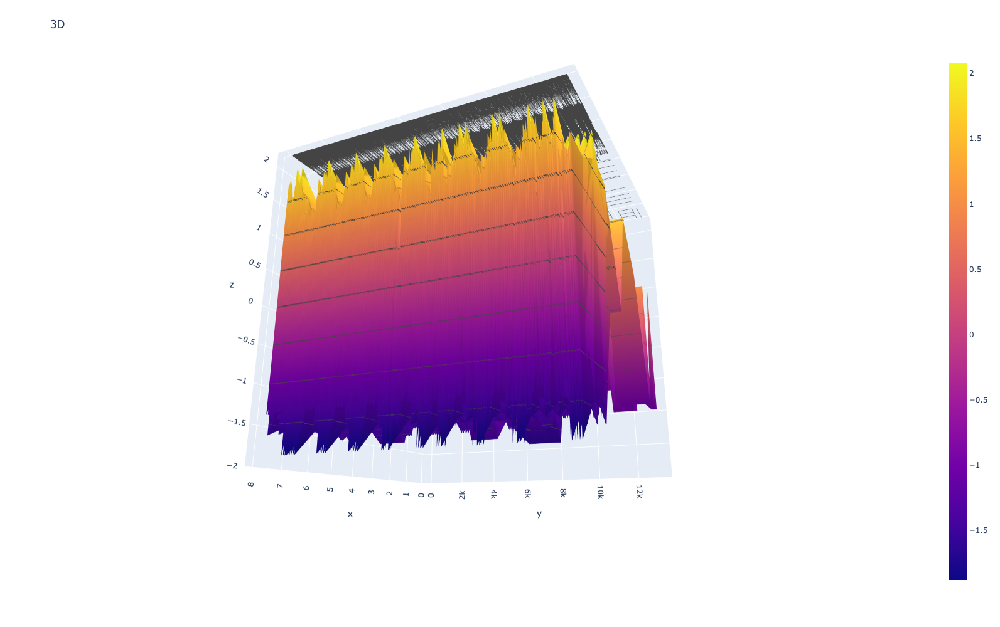

In [41]:
import plotly.graph_objects as go
import random
import pandas as pd

# Read data from a csv

fig = go.Figure(data=[go.Surface(z=scaled[indexes])])
fig.update_traces(contours_z=dict(show=True, usecolormap=False,
                                  project_z=True,))
fig.update_layout(title='3D', autosize=False,
                  scene_camera_eye=dict(x=1.87, y=0.88, z=-0.64),
                  width=1000, height=1000,
                  margin=dict(l=65, r=50, b=65, t=90),
)

fig.show()

In [47]:
scaled[0]

array([ 1.        ,  0.70792366, -1.43985638, -0.04278498,  1.19324229,
        1.3768676 , -1.04399746,  0.70639621,  0.59804456])

In [44]:
scaled.shape

(13230, 9)

In [42]:
1/0

/Users/ericcacciavillani/anaconda3/envs/eflow/lib/python3.8/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



ZeroDivisionError: division by zero

In [ ]:
auto_cluster = AutoCluster(pd.DataFrame(X,columns=feature_order),
                           dataset_name=dataset_name,
                           dataset_sub_dir=f"Exansion Auto Clustering/Full_Field/",
                           overwrite_full_path=None,
                           notebook_mode=True,
                           pca_perc=.8)

best_clusters = auto_cluster.create_elbow_models(model_names=["K-Means"],
                                                 sequences=2,
                                                 max_k_value=11,
                                                 display_visuals=True)

cluster_model = load_pickle_object(auto_cluster.folder_path + f"Models/K-Means/Clusters={best_clusters[1]}/K-Means_Clusters={best_clusters[1]}.pkl")
tmp_results = cluster_model.predict(auto_cluster.apply_clustering_data_pipeline(X[indexes]))

In [ ]:
for i in tmp_results:
    print(i)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=517,
    stratify=y,
)

In [ ]:
del X
del y

In [ ]:
# Find best parameters for model
param_grid = {
    "criterion": ["entropy", "gini"],
    "max_depth": [4,5,6,7,8,9,10,11,12,13,14,15,16],
    "min_samples_split": [2,5,10,15,30,40,50,60,70,80]
}

model, best_params = optimize_model_grid(
    model=DecisionTreeClassifier(),
    X_train=X_train,
    y_train=y_train,
    param_grid=param_grid,
    scoring="f1_micro",
    n_jobs=-1
)

In [ ]:
model_name = repr(model).split("(")[0]
model_name 

In [ ]:
model_analysis = ClassificationAnalysis(dataset_name=dataset_name,
                                        project_sub_dir="Exansion Auto Clustering/Modeling for DT",
                                        model=model,
                                        model_name=model_name,
                                        feature_order=feature_order,
                                        target_feature=df_features.target_feature(),
                                        pred_funcs_dict={"Probabilities function":model.predict_proba,
                                                         "Predict function":model.predict},
                                        sample_data=X_train[0],
                                        notebook_mode=notebook_mode,
                                        df_features=df_features)

In [ ]:
model_analysis.perform_analysis(X=X_train,
                                y=y_train,
                                dataset_name="Train Data",
                                classification_error_analysis=False,
                                classification_correct_analysis=False)

In [ ]:
model_analysis.perform_analysis(X=X_test,
                                y=y_test,
                                dataset_name="Test Data",
                                classification_error_analysis=False,
                                classification_correct_analysis=False)

In [ ]:
# viz = dtreeviz(model, 
#                X_test, 
#                y_test,
#                target_name='Target',
#                feature_names=feature_order, 
#                class_names=model.classes_.tolist())

In [ ]:
# viz.view()

In [ ]:
cluster_cut_off_points

In [ ]:
def expansion_prediction(model,
                         predicted_classes,
                         cluster_cut_off_points,
                         data):
    try:
        y_preds = model.predict(data)
    except AttributeError:
        pass

    for i,_ in enumerate(y_preds):
        for label_index,label in enumerate(cluster_cut_off_points):
            if y_preds[i] < label:
                y_preds[i] = list(predicted_classes)[label_index]
                break
    return y_preds

In [ ]:
dt_prediction = partial(expansion_prediction,
                        model,
                        predicted_classes,
                        cluster_cut_off_points)

In [ ]:
del X_train
del X_test
del y_train
del y_test

# Re-import dataset

In [ ]:
df = pd.read_csv(dataset_path)
shape_df = pd.DataFrame.from_dict({'Rows': [df.shape[0]],
                                   'Columns': [df.shape[1]]})
display(shape_df)
display(df.head(30))

In [ ]:
data_types_table(df)

# Loading and init df_features

In [ ]:
# Option: 1
# df_features = get_type_holder_from_pipeline(pipeline_name)

In [ ]:
# Option: 2
df_features = DataFrameTypes()
df_features.init_on_json_file(os.getcwd() + f"/eflow Data/{dataset_name}/df_features.json")

In [ ]:
df_features.display_features(display_dataframes=True,
                             notebook_mode=notebook_mode)

# Any extra processing before eflow DataPipeline

# Setup pipeline structure

### Interaction Required

In [ ]:
main_pipe = DataPipeline(pipeline_name,
                         df,
                         df_features)

In [ ]:
main_pipe.perform_pipeline(df,
                           df_features)

In [ ]:
df

In [ ]:
feature_order = list(df.columns)

In [ ]:
feature_order

In [ ]:
X = df.drop(columns=df_features.target_feature()).values
y = df[df_features.target_feature()].values
del df

In [ ]:
model_analysis = ClassificationAnalysis(dataset_name=dataset_name,
                                        project_sub_dir="Exansion Auto Clustering/Modeling for DT/Actual results",
                                        model=model,
                                        model_name=model_name,
                                        feature_order=feature_order,
                                        target_feature=df_features.target_feature(),
                                        pred_funcs_dict={"Predict function":dt_prediction},
                                        sample_data=X[0],
                                        notebook_mode=notebook_mode,
                                        df_features=df_features)

In [ ]:
model_analysis.perform_analysis(X=X,
                                y=y,
                                dataset_name="All Data",
                                classification_error_analysis=False,
                                classification_correct_analysis=False)

In [ ]:
feature_order.remove(df_features.target_feature())

In [ ]:
from sklearn.tree import export_text

dtree_node_level_cond = dict()

for tree_info in export_text(model,feature_names=feature_order).split("\n"):
    conditional_value = tree_info.split("|--- ")[1]
    depth_level = len(tree_info.split("|   ")) - 1
    dtree_node_level_cond[depth_level] = conditional_value
    
    if conditional_value[0:7] == "class: ":
        for i_level in range(0,depth_level):
            print(dtree_node_level_cond[i_level])
        
        target_val = int(dtree_node_level_cond[depth_level].split("class: ")[1])
        
        for i,label in enumerate(cluster_cut_off_points):
            if target_val < label:
                print(f"class: {i}")
                break
        print()